투빅스 12회 추천 컨퍼런스 Img2Seq(Show And Tell) 의 코드 정리입니다.

`Kor2Vec` 과 `pytorch` 를 사용했습니다.

In [1]:
from google.colab import drive
import pandas as pd
import json
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [2]:
cd '/content/drive/MyDrive/kor2vec_20210703'

/content/drive/MyDrive/kor2vec_20210703


# 기본 다운로드 및 임포트

In [3]:
!pip install git+https://github.com/naver/kor2vec.git

  Cloning https://github.com/naver/kor2vec.git to /tmp/pip-req-build-irhspnos
  Running command git clone -q https://github.com/naver/kor2vec.git /tmp/pip-req-build-irhspnos
  Created wheel for kor2vec: filename=kor2vec-1.0.1-cp37-none-any.whl size=21946 sha256=1455aae9786dd117a17c374658755585e8a54274582cc5cbca01b747e1cb0623
  Stored in directory: /tmp/pip-ephem-wheel-cache-zmpyaa8u/wheels/b7/74/03/492f7af08e1f00c56765b0f6a25f28a086cc23db1827f269a4
Successfully built kor2vec


In [4]:
from kor2vec import Kor2Vec # Kor2Vec import

import pandas as pd
import numpy as np
import os
from PIL import Image
import torch
import torchvision.models as models # 임베딩 모델
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

# 기본 변수 정의

In [5]:
# 리뷰 테이블 읽어오기
review = pd.read_csv('/content/drive/MyDrive/kor2vec_20210703/img_review_tag_df_final_20210701.csv')

In [6]:
review_tmp = review[['imgname_123', 'summary_text']]

In [ ]:
# !unzip -O euc-kr -q /content/drive/MyDrive/kor2vec_20210703/ -d data

17번가_1.jpg:  mismatching "local" filename (17踰媛_1.jpg),
         continuing with "central" filename version
17번가_2.jpg:  mismatching "local" filename (17踰媛_2.jpg),
         continuing with "central" filename version
17번가_3.jpg:  mismatching "local" filename (17踰媛_3.jpg),
         continuing with "central" filename version
1945카페_1.jpg:  mismatching "local" filename (1945移댄_1.jpg),
         continuing with "central" filename version
1945카페_2.jpg:  mismatching "local" filename (1945移댄_2.jpg),
         continuing with "central" filename version
1945카페_3.jpg:  mismatching "local" filename (1945移댄_3.jpg),
         continuing with "central" filename version
298카페_1.jpg:  mismatching "local" filename (298移댄_1.jpg),
         continuing with "central" filename version
298카페_2.jpg:  mismatching "local" filename (298移댄_2.jpg),
         continuing with "central" filename version
298카페_3.jpg:  mismatching "local" filename (298移댄_3.jpg),
         continuing with "central" filename 

In [7]:
os.listdir('/content/drive/MyDrive/kor2vec_20210703/image_data/img/')

['타르타르_3.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_1.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_2.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_3.jpg',
 '타이거 에스프레소_1.jpg',
 '타이거 에스프레소_2.jpg',
 '타이거 에스프레소_3.jpg',
 '타이완 슈가_1.jpg',
 '타이완 슈가_2.jpg',
 '타이완 슈가_3.jpg',
 '타이지엔_1.jpg',
 '타이지엔_2.jpg',
 '타이지엔_3.jpg',
 '타입커피_1.jpg',
 '타입커피_2.jpg',
 '타입커피_3.jpg',
 '타짜도르 강남점_1.jpg',
 '타짜도르 강남점_2.jpg',
 '타짜도르 강남점_3.jpg',
 '타짜도르 용산아이파크몰점_1.jpg',
 '타짜도르 용산아이파크몰점_2.jpg',
 '타짜도르 용산아이파크몰점_3.jpg',
 '탐나도다_1.jpg',
 '탐나도다_2.jpg',
 '탐나도다_3.jpg',
 '탐나서울_1.jpg',
 '탐나서울_2.jpg',
 '탐나서울_3.jpg',
 '태극당 인사점_1.jpg',
 '태극당 인사점_2.jpg',
 '태극당 인사점_3.jpg',
 '태극당_1.jpg',
 '태극당_2.jpg',
 '태극당_3.jpg',
 '태기커피_1.jpg',
 '태기커피_2.jpg',
 '태기커피_3.jpg',
 '태양커피 사당점_1.j

In [8]:
# 없는 파일 인덱스 파악
result = []
result2 = []
all_img = [f for f in os.listdir('/content/drive/MyDrive/kor2vec_20210703/image_data/img/') if os.path.isfile(os.path.join('/content/drive/MyDrive/kor2vec_20210703/image_data/img/', f))]

for idx, imgName in enumerate(review['imgname_123']):
  if imgName not in all_img:
    result.append(idx)
    result2.append(imgName)

In [ ]:
result2

['1023양과점_1.jpg',
 '1023양과점_3.jpg',
 '1023양과점_2.jpg',
 '10 꼬르소꼬모 카페_1.jpg',
 '10 꼬르소꼬모 카페_3.jpg',
 '10 꼬르소꼬모 카페_2.jpg',
 '10페이지 한양대1호점_2.jpg',
 '10페이지 한양대1호점_1.jpg',
 '10페이지 한양대1호점_3.jpg',
 '15칼로리_3.jpg',
 '15칼로리_1.jpg',
 '15칼로리_2.jpg',
 '17도씨_2.jpg',
 '17도씨_3.jpg',
 '17도씨_1.jpg',
 '17번가_2.jpg',
 '17번가_1.jpg',
 '17번가_3.jpg',
 '1945카페_2.jpg',
 '1945카페_1.jpg',
 '1945카페_3.jpg',
 '19호실_3.jpg',
 '19호실_1.jpg',
 '19호실_2.jpg',
 '1인1상_3.jpg',
 '1인1상_1.jpg',
 '1인1상_2.jpg',
 '1인1잔_1.jpg',
 '1인1잔_3.jpg',
 '1인1잔_2.jpg',
 '237플랫폼카페_3.jpg',
 '237플랫폼카페_2.jpg',
 '237플랫폼카페_1.jpg',
 '298카페_2.jpg',
 '298카페_1.jpg',
 '298카페_3.jpg',
 '33에이커_3.jpg',
 '33에이커_1.jpg',
 '33에이커_2.jpg',
 '36.5도여름_1.jpg',
 '36.5도여름_2.jpg',
 '36.5도여름_3.jpg',
 '37.5 서래마을점_2.jpg',
 '37.5 서래마을점_3.jpg',
 '37.5 서래마을점_1.jpg',
 '502세컨즈카페_1.jpg',
 '502세컨즈카페_2.jpg',
 '502세컨즈카페_3.jpg',
 '58도씨_1.jpg',
 '58도씨_3.jpg',
 '58도씨_2.jpg',
 '82년생 김민경_3.jpg',
 '82년생 김민경_2.jpg',
 '82년생 김민경_1.jpg',
 '8커피_3.jpg',
 '8커피_2.jpg',
 '8커피_1.jpg',
 '964 커피 로스터리_2.

In [ ]:
all_img

['타르타르_3.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_1.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_2.jpg',
 '타르틴베이커리  5호 용산아이파크몰점_3.jpg',
 '타이거 에스프레소_1.jpg',
 '타이거 에스프레소_2.jpg',
 '타이거 에스프레소_3.jpg',
 '타이완 슈가_1.jpg',
 '타이완 슈가_2.jpg',
 '타이완 슈가_3.jpg',
 '타이지엔_1.jpg',
 '타이지엔_2.jpg',
 '타이지엔_3.jpg',
 '타입커피_1.jpg',
 '타입커피_2.jpg',
 '타입커피_3.jpg',
 '타짜도르 강남점_1.jpg',
 '타짜도르 강남점_2.jpg',
 '타짜도르 강남점_3.jpg',
 '타짜도르 용산아이파크몰점_1.jpg',
 '타짜도르 용산아이파크몰점_2.jpg',
 '타짜도르 용산아이파크몰점_3.jpg',
 '탐나도다_1.jpg',
 '탐나도다_2.jpg',
 '탐나도다_3.jpg',
 '탐나서울_1.jpg',
 '탐나서울_2.jpg',
 '탐나서울_3.jpg',
 '태극당 인사점_1.jpg',
 '태극당 인사점_2.jpg',
 '태극당 인사점_3.jpg',
 '태극당_1.jpg',
 '태극당_2.jpg',
 '태극당_3.jpg',
 '태기커피_1.jpg',
 '태기커피_2.jpg',
 '태기커피_3.jpg',
 '태양커피 사당점_1.j

In [ ]:
review['imgname_123']

0                &meal_2.jpg
1                &meal_1.jpg
2                &meal_3.jpg
3              1023양과점_1.jpg
4              1023양과점_3.jpg
                ...         
8235              히포커피_2.jpg
8236              히포커피_3.jpg
8237    힘이나는커피생활 성수2호점_1.jpg
8238    힘이나는커피생활 성수2호점_2.jpg
8239    힘이나는커피생활 성수2호점_3.jpg
Name: imgname_123, Length: 8240, dtype: object

In [ ]:
# 잘못된 이미지 파일 제거
review.drop(result, inplace=True)
review.dropna(inplace=True)
review = review.reset_index(drop = True)

In [9]:
review_tmp.columns = ['imgname_123', 'review']

In [10]:
review_tmp.loc[review_tmp['imgname_123'] == '김동훈 coffee & 테라피_3.jpg', :]

,imgname_123,review
753,김동훈 coffee & 테라피_3.jpg,['드립' '커피' '전문점' '그렇' '카페' '떼' '원두' '그날' '그날' ...


In [11]:
review_tmp.drop(753, axis = 0, inplace = True)
review_tmp = review_tmp.reset_index(drop = True)

In [12]:
review_tmp.loc[review_tmp['imgname_123'] == '올라하이_3.jpg', :]

,imgname_123,review
4567,올라하이_3.jpg,['디저트' '맛있' '매장' '깔끔' '여자' '카페' '모임' '좋']


In [13]:
review_tmp.drop(4567, axis = 0, inplace = True)
review_tmp = review_tmp.reset_index(drop = True)

In [14]:
review_tmp.loc[review_tmp['imgname_123'] == '쥬씨&차얌 양재점_3.jpg', :]

,imgname_123,review
5164,쥬씨&차얌 양재점_3.jpg,['내부' '화장실' '와이' '파이' '내부' '공간' '없' '테이크' '아웃'...


In [15]:
review_tmp.drop(5164, axis = 0, inplace = True)
review_tmp = review_tmp.reset_index(drop = True)

In [16]:
review_tmp.loc[review_tmp['imgname_123'] == '오미자카페 & 디저트_3.jpg', :]

,imgname_123,review
4399,오미자카페 & 디저트_3.jpg,['기대' '이상' '맛있' '가격' '개' '당' '저렴' '올해' '마카롱' '...


In [17]:
review_tmp.drop(4399, axis = 0, inplace = True)
review_tmp = review_tmp.reset_index(drop = True)

In [29]:
from sklearn.feature_extraction.text import TfidfVectorizer

corpus = review_tmp['review']

vectorizer = TfidfVectorizer()

X = vectorizer.fit_transform(corpus)

print(vectorizer.get_feature_names())
print(X.shape)


['가가', '가게', '가격', '가격대', '가격대비', '가고파', '가구', '가구점', '가급적', '가기', '가까이', '가깝', '가나', '가늘', '가늠', '가능', '가도', '가독성', '가드', '가든', '가래떡', '가량', '가로', '가로등', '가로수', '가루', '가림', '가맹점', '가면', '가방', '가벼운', '가볍', '가보', '가본', '가산', '가성', '가세', '가슴살', '가시', '가시길', '가실', '가야', '가양', '가옥', '가요', '가운데', '가을', '가이', '가재', '가정', '가정집', '가족', '가좌', '가죽', '가지', '가짓수', '가치', '가향', '가혹', '각각', '각도', '각설탕', '각오', '각인', '각자', '각종', '간격', '간결', '간단', '간도', '간략', '간만', '간소', '간식', '간은', '간이', '간장', '간직', '간판', '간편', '갈비', '갈비집', '갈색', '갈의', '갈이', '갈증', '감각', '감각적', '감격', '감과', '감귤', '감기', '감도', '감독', '감동', '감동적', '감미', '감사', '감상', '감성', '감수', '감안', '감이', '감자', '감정', '감탄', '감흥', '갑작스럽', '갑진', '값어치', '강남', '강대', '강동구', '강력', '강렬', '강변', '강서구', '강세', '강아지', '강의', '강자', '강조', '강좌', '강추', '강풀', '강하', '강한', '강해', '개가', '개구리', '개그맨', '개랑', '개발', '개발원', '개방', '개방적', '개방형', '개별', '개별적', '개봉', '개봉동', '개선', '개성', '개수대', '개운', '개인', '개인적', '개정', '개조', '갤러리', '거대', '거도', '거랑', '거래', '거로', '거름망', '거리', '거만', '거부감', '거울',

In [51]:
[review_tmp['review'][0]]

"['섬' '역' '골목' '위치' '맛' '집' '인' '앤드' '생각' '양이' '많' '배부르' '크림' '맛있' '곳']"

In [52]:
vectorizer.transform([review_tmp['review'][0]])

<1x4357 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>

In [30]:
# 리뷰 데이터를 사용해 임베딩을 학습 실시

rev = pd.Series("<sos> " + review_tmp['review'])
rev.to_csv("review_corpus.csv")


kor2vec = Kor2Vec(embed_size=64) # embed_size : 임베딩 벡터의 2번째 차원(차원 수)
"""
train([텍스트 데이터 파일 - 위에서 저장, 모델 저장 위치, 학습 배치 사이즈])
"""
kor2vec.train("review_corpus.csv", 'model.kor2vec', batch_size=128) # 임베딩 실시 (학습)
kor2vec.save("/content/drive/MyDrive/kor2vec_20210703/kor2vec_embedding_folder/kor2vec_embedding") # 임베딩 모델 저장



Corpus Sampling:  27%|██▋       | 3732/14067 [00:00<00:00, 37316.48it/s]

Reading Corpus lines


Corpus Sampling: 100%|██████████| 14067/14067 [00:00<00:00, 36951.36it/s]


Training kor2vec
Loading Word_sample corpus
Loading corpus finished
CUDA Available/count: True 1
training on  cuda:0


EP 0: 100%|██████████| 744/744 [00:09<00:00, 80.37it/s]


{'epoch': 0, 'train_ep_loss': 1.357943564493169}


EP 1: 100%|██████████| 744/744 [00:08<00:00, 83.12it/s]


{'epoch': 1, 'train_ep_loss': 1.1608356527423347}


EP 2: 100%|██████████| 744/744 [00:08<00:00, 83.13it/s]


{'epoch': 2, 'train_ep_loss': 1.10576638226868}


EP 3:  40%|███▉      | 294/744 [00:03<00:05, 83.56it/s]

KeyboardInterrupt: ignored

멀티배치 수정

In [94]:
class CaptionDataset(Dataset):
    """
    root_dir : 이미지 파일이 있는 경로
    captions_file : 이미지 제목-리뷰가 포함된 데이터프레임
    transform : 이미지를 텐서로 변환할 때 transform (optional)
    """
    def __init__(self, img_dir, caption_df, transform=None):
        self.root_dir = img_dir
        self.transform = transform
        self.df = caption_df
        
        self.imgs = self.df['imgname_123'] # 이미지 파일 경로
        self.captions = self.df["review"] # 리뷰 데이터
        self.kor2vec = Kor2Vec.load("/content/drive/MyDrive/kor2vec_20210703/kor2vec_embedding_folder/kor2vec_embedding") # Kor2Vec 로드
        self.tfidf = vectorizer
    
    def __len__(self):
        return len(self.df)
    
    # 이미지, 텍스트를 불러 오는 메소드
    # transform을 선언하면 임베딩 벡터와 1개 배치로 반환하며, 선언하지 않으면 이미지와 스트링 형태의 캡션을 반환합니다.
    def __getitem__(self,idx):
        caption = self.captions[idx] # target caption
        
        img_name = self.imgs[idx] # 이미지 이름 파일 불러오기
        img_location = os.path.join(self.root_dir,img_name) # 실제로 이미지 오픈
        img = Image.open(img_location).convert("RGB")
        
        # transform이 있다면 실시 후 배치화(1 차원 추가)
        if self.transform is not None:
          img = self.transform(img)
          # 정답 임베딩 데이터 
          # seq_len을 15로 통일하고자 합니다.
          # caption = self.kor2vec.embedding(caption, seq_len=15)
          # print(caption)
          caption = self.tfidf.transform([caption])
          caption = caption.todense()
          caption = np.array(caption)
          caption = torch.tensor(caption, dtype = torch.float32)
        return img, caption

이걸 구현해 보려는 시도
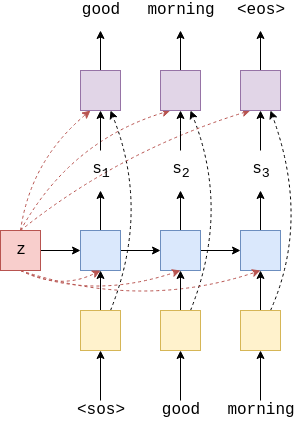

In [95]:
# from https://github.com/bentrevett/pytorch-seq2seq/blob/master/2%20-%20Learning%20Phrase%20Representations%20using%20RNN%20Encoder-Decoder%20for%20Statistical%20Machine%20Translation.ipynb
class Decoder(nn.Module):
    def __init__(self, output_dim, emb_dim, hid_dim, dropout):
        super().__init__()
        self.hid_dim = hid_dim
        self.output_dim = output_dim
        self.embedding = nn.Embedding(output_dim, emb_dim)
        self.rnn = nn.GRU(emb_dim + hid_dim, hid_dim)
        self.fc_out = nn.Linear(emb_dim + hid_dim * 2, output_dim)
        self.dropout = nn.Dropout(dropout)

        # self.kor2vec = Kor2Vec.load("/content/drive/MyDrive/koremb_tobigs/embedding")

    def forward(self, input, hidden, context):
        
        #input = [batch_size]
        #hidden = [n layers * n directions, batch size, hid dim]
        #context = [n layers * n directions, batch size, hid dim]
        
        #n layers and n directions in the decoder will both always be 1, therefore:
        #hidden = [1, batch size, hid dim]
        #context = [1, batch size, hid dim]
        
        embedded = self.dropout(input)
        
        #embedded = [1, batch size, emb dim]
        emb_con = torch.cat((embedded, context), dim = 2)
            
        #emb_con = [1, batch size, emb dim + hid dim]
            
        output, hidden = self.rnn(emb_con, hidden)
      
        #output = [seq len, batch size, hid dim * n directions]
        #hidden = [n layers * n directions, batch size, hid dim]
        
        #seq len, n layers and n directions will always be 1 in the decoder, therefore:
        #output = [1, batch size, hid dim]
        #hidden = [1, batch size, hid dim]
        
        output = torch.cat((embedded.squeeze(0), hidden.squeeze(0), context.squeeze(0)), 
                           dim = 1)
        
        #output = [batch size, emb dim + hid dim * 2]
        
        prediction = self.fc_out(output)
        
        #prediction = [batch size, output dim]
        
        return prediction.unsqueeze(0), hidden

In [96]:
class Net(nn.Module):
  """
  신경망 파일
  hidden_size : kor2vec의 embedding size 로 맞춰야 합니다.
  """
  def __init__(self, seq_len = 15, embedding_size = 64, hidden_size = 64):
    super(Net, self).__init__()
    self.seq_len = seq_len
    self.embedding_size = embedding_size
    self.hidden_size = hidden_size
    self.resnet = models.resnet18(pretrained=True)
    self.decoder = Decoder(64, self.embedding_size, self.hidden_size, 0.5)
    self.kor2vec = Kor2Vec.load("/content/drive/MyDrive/kor2vec_20210703/kor2vec_embedding_folder/kor2vec_embedding")
    self.tfidf = vectorizer

    self.fc1 = nn.Linear(64, 4357)


    # resNet의 모든 파라미터를 잠그고 마지막 레이어만 얼리지 않고 사용합니다.
    for param in self.resnet.parameters():
       param.requires_grad = False
    self.resnet.fc = nn.Linear(512, 64) # 마지막 레이어만 다시 사용합니다.

    # kor2vec의 모든 파라미터를 얼립니다.
    for param in self.kor2vec.parameters():
       param.requires_grad = False

  def forward(self, x):
    batch_size = x.shape[0]
    x = self.resnet(x).reshape(1,batch_size,self.hidden_size) # resnet 통과 output: (batch, hidden)

    outputs = self.fc1(x)

    '''
    hidden = x # lstm의 초기 셀 값은 resNet의 출력입니다.
    outputs = torch.zeros(self.seq_len, batch_size, self.embedding_size).to(device) # sequence를 저장하기 위한 빈 배열
    

    # <sos> 를 시작 토큰으로 설정합니다.
    output = self.kor2vec.embedding('<sos>').unsqueeze(0).repeat(1, batch_size, 1).to(device)

    # seq 결과물을 lstm의 입력으로 사용하여 seq_len = 15 만큼 반복하여 저장합니다.
    for t in range(0, self.seq_len):
        output, hidden = self.decoder(output, hidden, x ) 
        outputs[t] = output
   '''     

    return outputs # shape: (15, batch_size, 1000)


  def give_embedding(self, x):  # 원도 추가 부분
    batch_size = x.shape[0]
    x = self.resnet(x).reshape(1,batch_size,self.hidden_size) # resnet 통과 output: (batch, hidden)

    outputs = self.fc1(x)

    return outputs
  
  def give_resnet_embedding(self, x):  # 원도 추가 부분
    batch_size = x.shape[0]
    x = self.resnet(x).reshape(1,batch_size,self.hidden_size) # resnet 통과 output: (batch, hidden)

    hidden = x # lstm의 초기 셀 값은 resNet의 출력입니다.
    return hidden

  # model.train() 을 위해 메소드 오버라이딩
  def train(self, mode=True):  
    self.training = mode
    for module in self.children():
      if module != self.kor2vec:
        module.train(mode)
    return self

  # model.eval() 을 위한 설정
  def eval(self, mode=False): 
    # self.training = mode
    for module in self.children():
      if module != self.kor2vec:
        module.train(mode)
    return self

# 실제 코드 불러와서 사용

['매장' '넓' '디' '근처' '조용' '카페' '때' '좋' '흑임자' '라' '떼' '맛있']


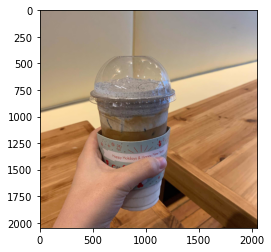

In [97]:
# 이미지 표시 : transform을 None으로 놓고 사용
img_data = CaptionDataset('/content/drive/MyDrive/kor2vec_20210703/image_data/img/', review_tmp, transform=None)
img, rev = img_data[6666]

print(rev)
plt.imshow(img)
plt.show()

In [98]:

transform = transforms.Compose(
    [transforms.ToTensor(), # 텐서로 변형
     transforms.Resize(224), # 사이즈 조절
     transforms.CenterCrop(224), # 가로와 세로 중 안 맞는 곳 자르기
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [99]:
train_data = CaptionDataset('/content/drive/MyDrive/kor2vec_20210703/image_data/img/', review_tmp, transform=transform)

img, rev = train_data[1]


print(f"img shape : {img.shape}") # ([1, 3, 224, 224]) - [배치, 채널, 가로, 세로]
print(f"rev : {rev.shape}") # ([15, 1000]) - [seq_len, hidden_size]

img shape : torch.Size([3, 224, 224])
rev : torch.Size([1, 4357])


In [100]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_data, batch_size=64, shuffle=True)

In [101]:
model = Net()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [102]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [103]:
model.to(device)

Net(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_

In [104]:
# 신경망 학습
for epoch in range(2): # 10에포크
  running_loss = 0.0

  for i, data in enumerate(train_dataloader):
    img, label = data[0].to(device), data[1].to(device)
    optimizer.zero_grad()
    output = model(img)


    loss = criterion(output, label.to(device))
    loss = loss.to(torch.float32)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    
    if i>= len(train_dataloader) - 1: break # 왜인지 모르겠으나 묵시적으로 enumerate가 종료되지 않아서 명시적으로 추가
    
    if (i % 10) == 0: # 매 10번 미니배치마다 출력하기
            print('[%d, %5d] loss: %.3f' %
                  (epoch +1, i+1, running_loss / (i + 1)))
            running_loss =0.0

[1,     1] loss: 0.153
[1,    11] loss: 0.064
[1,    21] loss: 0.021
[1,    31] loss: 0.010
[1,    41] loss: 0.006
[1,    51] loss: 0.004
[1,    61] loss: 0.002
[1,    71] loss: 0.002
[1,    81] loss: 0.001
[1,    91] loss: 0.001
[1,   101] loss: 0.001
[1,   111] loss: 0.001
[1,   121] loss: 0.000
[2,     1] loss: 0.005
[2,    11] loss: 0.004
[2,    21] loss: 0.002
[2,    31] loss: 0.001
[2,    41] loss: 0.001
[2,    51] loss: 0.001
[2,    61] loss: 0.000
[2,    71] loss: 0.000
[2,    81] loss: 0.000
[2,    91] loss: 0.000
[2,   101] loss: 0.000
[2,   111] loss: 0.000
[2,   121] loss: 0.000


In [ ]:
1+1

2

In [ ]:
2+2

4

# tsne 코드

In [ ]:
!pip install lapjv==1.3.12 -q

In [ ]:
import numpy as np
import os, argparse
import matplotlib as mlp
import matplotlib.pyplot as plt
from PIL import Image
from lapjv import lapjv
from sklearn.manifold import TSNE
from scipy.spatial.distance import cdist


out_res = 64
out_name = 'tsne_grid.jpg'
out_dim = 40
to_plot = np.square(out_dim)
perplexity = 50
tsne_iter = 5000
in_dir = '/content/data'
out_dir = './'

img_table = review


def get_activations(model, img_collection):
    activations = []
    for idx in range(len(img_collection)):
        if idx == to_plot:
            break;

        if idx % 1000 == 0:
          print("image ~{} processed.".format(idx+1))

        img = review['imgname_123'][idx]
        img = os.path.join(in_dir, img)

        open_img = Image.open(img).convert('RGB')
        img = transform(open_img)

        pred = model(img.unsqueeze(0).to(device)) # (15, hidden)
        color_img = np.array((open_img.resize((10,10))))

        act = np.concatenate((pred.flatten().cpu().detach().numpy(), color_img.flatten()))
        activations.append(act)
    return activations

def generate_tsne(activations):
    tsne = TSNE(perplexity=perplexity, n_components=2, init='random', n_iter=tsne_iter)
    X_2d = tsne.fit_transform(np.array(activations)[0:to_plot,:])
    X_2d -= X_2d.min(axis=0)
    X_2d /= X_2d.max(axis=0)
    return X_2d

def save_tsne_grid(img_collection, X_2d, out_res, out_dim):
    grid = np.dstack(np.meshgrid(np.linspace(0, 1, out_dim), np.linspace(0, 1, out_dim))).reshape(-1, 2)
    cost_matrix = cdist(grid, X_2d, "sqeuclidean").astype(np.float32)
    cost_matrix = cost_matrix * (100000 / cost_matrix.max())
    row_asses, col_asses, _ = lapjv(cost_matrix)
    grid_jv = grid[col_asses]
    out = np.ones((out_dim*out_res, out_dim*out_res, 3), dtype=np.uint8)

    for pos, img in zip(grid_jv, img_collection['imgname_123'][0:to_plot]):
        img = os.path.join(in_dir, img)
        open_img = Image.open(img).convert('RGB')
        open_img = open_img.resize((out_res,out_res))
        h_range = int(np.floor(pos[0]* (out_dim - 1) * out_res))
        w_range = int(np.floor(pos[1]* (out_dim - 1) * out_res))
        out[h_range:h_range + out_res, w_range:w_range + out_res] = np.array(open_img)
   

    im = Image.fromarray(out)
    im.save(out_dir + out_name, quality=100)

print("hello")
sampled_img = img_table.sample(n=(out_dim*out_dim)).reset_index(drop=True)

activations = get_activations(model, sampled_img)
print("Generating 2D representation.")
X_2d = generate_tsne(activations)
print("Generating image grid.")
save_tsne_grid(sampled_img, X_2d, out_res, out_dim)

hello
image ~1 processed.
image ~1001 processed.
Generating 2D representation.
Generating image grid.


# 추천 10개 표시

In [105]:
# 가장 유사한, 가장 유사하지 않은 것 비교 코드


i_list = []
resnet_embed_list = []
embed_list = []

# 모든 이미지에 대한 임베딩 계산
for i, data in enumerate(train_data):
    model.eval()
    
    img, label = data[0].to(device), data[1].to(device)
    img = img.unsqueeze(0)
    resnet_embed = model.give_resnet_embedding(img)[0].cpu().detach().numpy()[0][0]
    embed = model.give_embedding(img)[0].cpu().detach().numpy()[0][0]


    i_list.append(i)
    embed_list.append(embed)
    resnet_embed_list.append(resnet_embed)

    if i>= len(train_data) - 1: break

    if i%100 == 0:
      print(f"image done : {i}")

image done : 0
image done : 100
image done : 200
image done : 300
image done : 400
image done : 500
image done : 600
image done : 700
image done : 800
image done : 900
image done : 1000
image done : 1100
image done : 1200
image done : 1300
image done : 1400
image done : 1500
image done : 1600
image done : 1700
image done : 1800
image done : 1900
image done : 2000
image done : 2100
image done : 2200
image done : 2300
image done : 2400
image done : 2500
image done : 2600
image done : 2700
image done : 2800
image done : 2900
image done : 3000
image done : 3100
image done : 3200
image done : 3300
image done : 3400
image done : 3500
image done : 3600
image done : 3700
image done : 3800
image done : 3900
image done : 4000
image done : 4100
image done : 4200
image done : 4300
image done : 4400
image done : 4500
image done : 4600
image done : 4700
image done : 4800
image done : 4900
image done : 5000
image done : 5100
image done : 5200
image done : 5300
image done : 5400
image done : 5500
imag

target img : 1001
8235, ['분위기' '좋' '방문' '얼마' '안' '조용' '분위기' '좋']


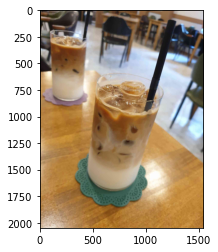

가장 가까운 이미지
0, ['분위기' '좋' '방문' '얼마' '안' '조용' '분위기' '좋'], distance : 0.0


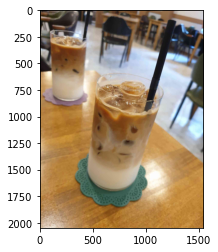

1, ['따뜻' '분위기' '동네' '카페' '맛있'], distance : 1.0892748832702637e-05


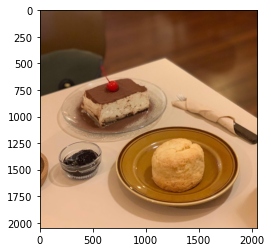

2, ['예전' '때' '카스' '테라' '맛' '고급' '맛' '가격' '비싸' '어리' '향수' '이상' '구매' '컵' '아이스크림'
 '무료' '제공' '아이스크림' '깔끔'], distance : 1.921132206916809e-05


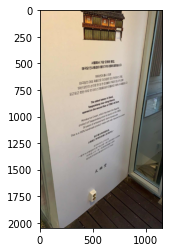

3, ['가산' '디지털' '단지' '최고' '방차' '카페' '전식' '오미자' '차' '생밤' '은행' '곶감' '카페' '시' '처'
 '본' '메뉴인' '십전' '대보' '차' '단돈' '카페' '명칭' '일드' '머' '블루' '차' '은' '와일드' '베리'
 '산' '딸기' '멀' '베리' '오디' '블루' '베리' '말' '선' '인상' '부부' '운영' '좋'], distance : 3.658980131149292e-05


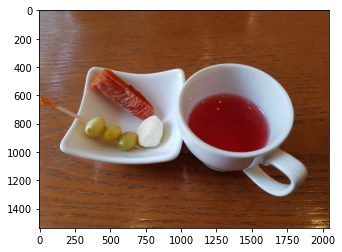

4, ['커피' '맛' '무난' '내부' '화려' '예쁘' '사진' '좋' '야외' '테라스' '좌석'], distance : 3.781542181968689e-05


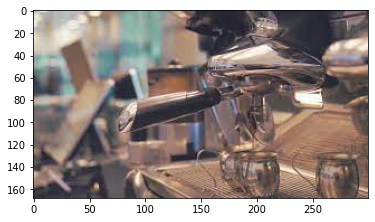

5, ['목' '동의' '디저트' '카페' '케익' '류' '기타' '디저트' '맛있'], distance : 3.7997961044311523e-05


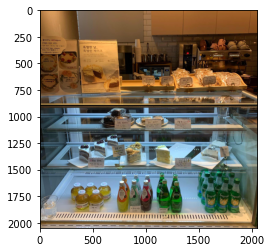

6, ['패키지' '이쁘' '맛' '좋' '아이스크림' '도' '득' '라미' '수도' '촉촉'], distance : 4.722177982330322e-05


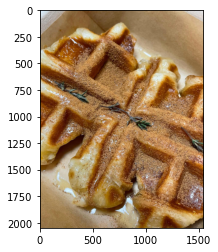

7, ['만화' '종류' '다양' '편안' '분위기' '단점' '화장실' '공용'], distance : 4.978477954864502e-05


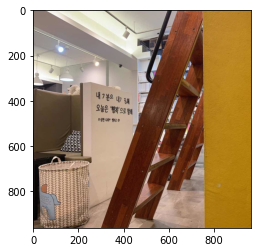

8, ['성수' '저렴' '카페' '힘들' '요기' '예쁘' '저렴'], distance : 5.0030648708343506e-05


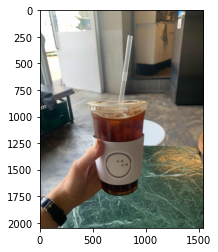

9, ['샌드위치' '맛있' '토핑' '요구르트' '음료' '맛있' '사장님' '친절'], distance : 5.272030830383301e-05


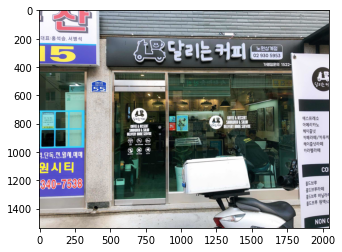

가장 먼 이미지
0, ['동네' '숨' '카페' '예' '가정집' '같' '예쁘' '인테리어' '카페' '카페인' '안되' '사람' '모든' '커피'
 '디' '카페인' '전환' '좋' '커피숍'], distance : 0.11894064396619797


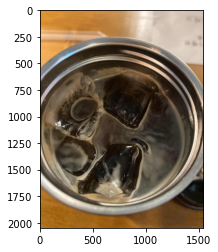

1, ['동네' '주민' '같' '한적' '카페' '카페' '좌석' '문' '배치' '좋' '카페' '좋'], distance : 0.12069431692361832


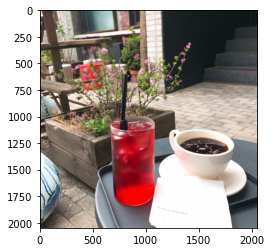

2, ['카페' '예쁘' '양과자' '맛있' '주인' '분' '친절' '주차' '가능' '좋'], distance : 0.12187584489583969


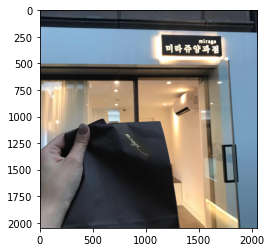

3, ['예쁘' '향기' '카페' '주인' '언니' '친절' '카페' '메뉴' '이쁘' '맛' '좋' '사진' '예쁘' '스피커' '음향'
 '좋' '그릇' '예쁘' '좋'], distance : 0.123773954808712


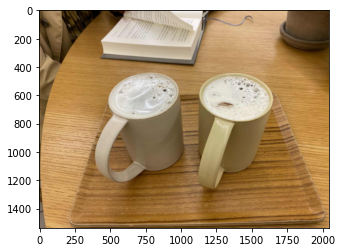

4, ['암' '위치' '인' '스타' '유명' '케이크' '가게' '한성' '대' '입구' '기념일' '프로젝트' '운영' '때'
 '방문' '고려대' '오픈' '마이' '버터' '드림' '내가' '방문' '때' '웨이팅' '맛' '웨이팅' '각오' '정도'
 '맛'], distance : 0.12568055093288422


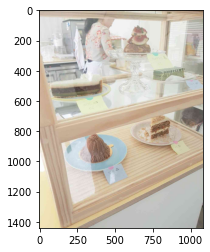

5, ['가격' '보고' '수긍' '곳' '맛있' '구슬' '맛있' '슈크림' '레' '알'], distance : 0.12865424156188965


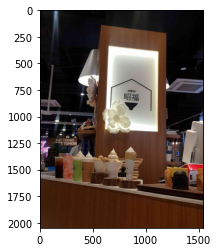

6, ['이' '커피' '맛' '커피' '맛있' '카페' '무엇' '테이블' '책' '은은' '조명' '아늑' '인테리어' '좋'], distance : 0.1400756686925888


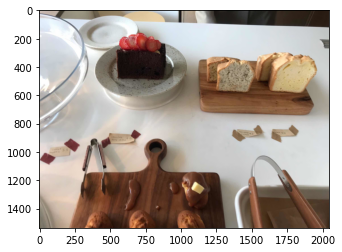

7, ['사진' '좋' '수' '길' '프로젝트' '서울' '곳곳' '포토' '존' '업' '로드' '사진' '좋' '곳' '사람' '없'
 '한적' '밀크' '당근' '케이크' '맛있' '화려' '예쁘' '편하' '느낌'], distance : 0.1405818611383438


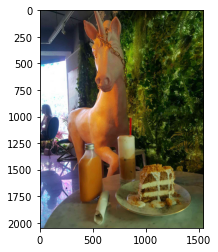

8, ['인' '스타' '만큼' '맛있' '재' '방문' '의사' '없'], distance : 0.1431887298822403


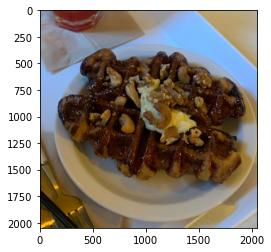

9, ['레드' '벨벳' '짱' '같' '맛있' '전체적' '마카롱' '사랑'], distance : 0.14480730891227722


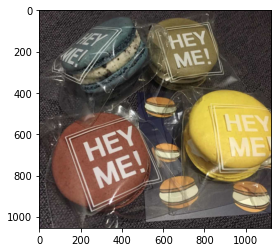

In [106]:

# text embedding 을 한 것을 통해 target image와 가장 가까운 10개, 가장 먼 10개 보여주기
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import matplotlib.pyplot as plt

tmp = np.array(embed_list).reshape(-1,1)
dist_mtx = euclidean_distances(tmp,tmp)

target_idx = 1001

# 가장 가까운 것의 인덱스를 제공해준다
# ex target_idx가 200이라면, 첫 인덱스는 200
close_list = dist_mtx[target_idx].argsort()[0:10]
far_list = dist_mtx[target_idx].argsort()[-11:-1]

print(f"target img : {target_idx}")
img, rev = img_data[target_idx]
print(f"{i}, {rev}")
plt.imshow(img)
plt.show()


print("가장 가까운 이미지")
print("======================")
# target을 포함해 target과 가장 가까운 것 10개
for i, idx in enumerate(close_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()

print("가장 먼 이미지")
print("======================")
# target과 가장 먼것 10개
for i, idx in enumerate(far_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()



In [ ]:
far_list

array([8019, 6307, 6339, 7860, 3078, 7186,   89,  105, 7215, 8046])

target img : 6307
9, ['낙산' '공원' '입구' '위치' '서울' '야경' '차' '좋' '손님' '많' '편이' '음식' '맛' '괜찮' '와플'
 '가격' '저렴' '맛있']


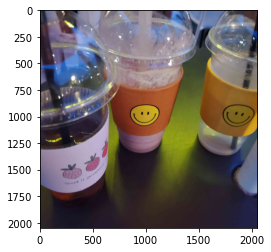

가장 가까운 이미지
0, ['낙산' '공원' '입구' '위치' '서울' '야경' '차' '좋' '손님' '많' '편이' '음식' '맛' '괜찮' '와플'
 '가격' '저렴' '맛있'], distance : 0.0


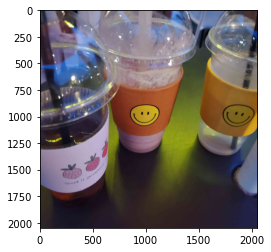

1, ['외국' '재료' '좋' '그렇' '고급' '맛' '가격' '있음' '손님' '적' '카페' '혼' '카페' '좋'], distance : 2.332031726837158e-06


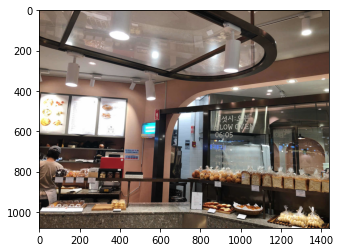

2, ['커피' '가격' '저렴' '부담' '좋'], distance : 1.0542571544647217e-05


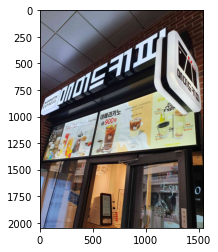

3, ['알바' '퇴사' '권장' '음료' '유명' '주문' '때' '죄송' '친절' '응대' '음료' '정도' '밥' '든든' '음료'
 '자체' '깨끗' '없' '인지' '자리' '본인' '알바' '생' '분' '테이블' '클린' '늦' '같' '음료' '치우'
 '셀프' '테이블' '친절' '응대' '모습' '감사'], distance : 1.5914440155029297e-05


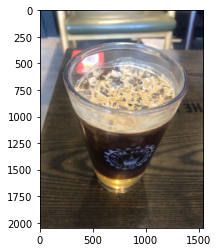

4, ['커피' '맛' '모름' '주차' '편하' '이용'], distance : 3.645569086074829e-05


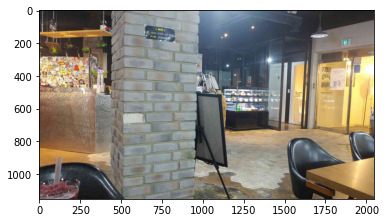

5, ['방학' '역' '인근' '위치' '카페' '그렇' '손님' '많' '가게' '메뉴' '구성' '맛' '특별' '점' '없'
 '지리적' '위치' '좋' '무료' '주차' '가능' '그렇' '근처' '때' '커피숍'], distance : 4.0378421545028687e-05


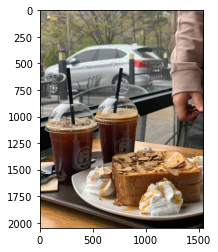

6, ['염리' '동' '주택가' '언덕배기' '자리' '인' '운영' '카페' '작' '입소문' '타고' '사람' '곳' '통창' '볕'
 '버건디' '레드' '올리브' '그린' '크' '레이' '컬러' '내부' '인테리어' '차분' '좋' '메뉴' '선택' '하루'
 '일과' '시작' '커피' '라' '아이스' '드립' '아이스' '라' '떼' '곁' '간단' '쿠키' '오늘' '커피' '주문'
 '아이스크림' '디저트' '인기' '한데' '거리' '멀' '배' '고프' '주문' '둘' '맛' '깔끔' '괜찮' '동네'
 '주민'], distance : 4.41819429397583e-05


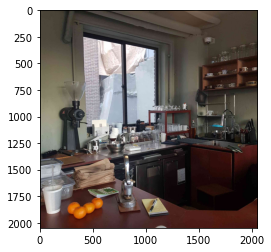

7, ['딸기' '요거트' '디' '딸기' '진하' '맛' '좋' '양도' '적당'], distance : 8.050724864006042e-05


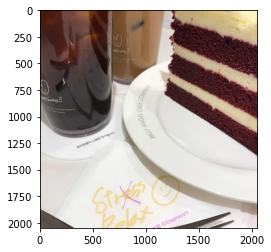

8, ['원래' '마감' '머' '운영' '저녁' '쯤' '조용' '이야기' '나누기' '좋' '곳' '아쉽' '논' '커피' '메뉴'
 '많' '마카롱'], distance : 0.00010614842176437378


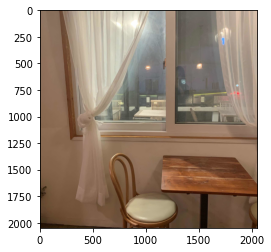

9, ['음료' '종류' '다양' '아늑' '카페' '오두막집' '같' '카페' '과일' '베이스' '음료' '많' '좋'], distance : 0.00012218952178955078


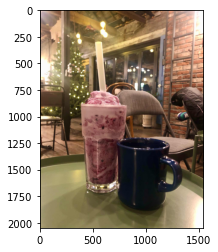

가장 먼 이미지
0, ['동네' '숨' '카페' '예' '가정집' '같' '예쁘' '인테리어' '카페' '카페인' '안되' '사람' '모든' '커피'
 '디' '카페인' '전환' '좋' '커피숍'], distance : 0.1504133939743042


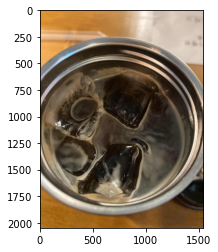

1, ['동네' '주민' '같' '한적' '카페' '카페' '좌석' '문' '배치' '좋' '카페' '좋'], distance : 0.15216708183288574


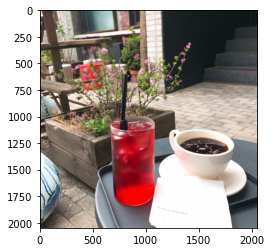

2, ['카페' '예쁘' '양과자' '맛있' '주인' '분' '친절' '주차' '가능' '좋'], distance : 0.15334860980510712


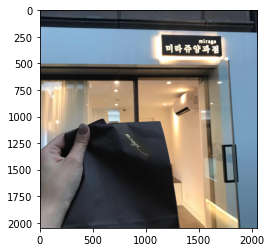

3, ['예쁘' '향기' '카페' '주인' '언니' '친절' '카페' '메뉴' '이쁘' '맛' '좋' '사진' '예쁘' '스피커' '음향'
 '좋' '그릇' '예쁘' '좋'], distance : 0.15524671971797943


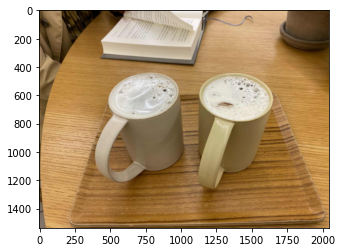

4, ['암' '위치' '인' '스타' '유명' '케이크' '가게' '한성' '대' '입구' '기념일' '프로젝트' '운영' '때'
 '방문' '고려대' '오픈' '마이' '버터' '드림' '내가' '방문' '때' '웨이팅' '맛' '웨이팅' '각오' '정도'
 '맛'], distance : 0.15715330839157104


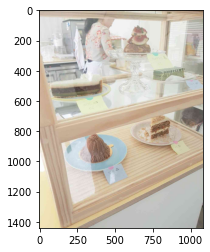

5, ['가격' '보고' '수긍' '곳' '맛있' '구슬' '맛있' '슈크림' '레' '알'], distance : 0.16012701392173767


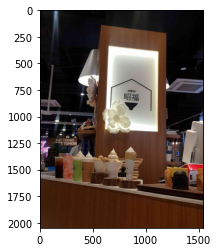

6, ['이' '커피' '맛' '커피' '맛있' '카페' '무엇' '테이블' '책' '은은' '조명' '아늑' '인테리어' '좋'], distance : 0.17154842615127563


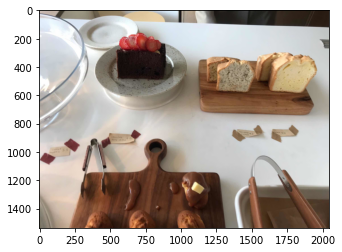

7, ['사진' '좋' '수' '길' '프로젝트' '서울' '곳곳' '포토' '존' '업' '로드' '사진' '좋' '곳' '사람' '없'
 '한적' '밀크' '당근' '케이크' '맛있' '화려' '예쁘' '편하' '느낌'], distance : 0.17205461859703064


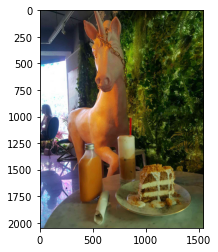

8, ['인' '스타' '만큼' '맛있' '재' '방문' '의사' '없'], distance : 0.17466148734092712


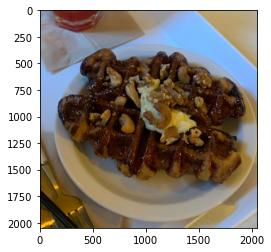

9, ['레드' '벨벳' '짱' '같' '맛있' '전체적' '마카롱' '사랑'], distance : 0.17628006637096405


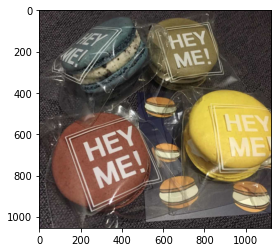

In [107]:
# text embedding 을 한 것을 통해 target image와 가장 가까운 10개, 가장 먼 10개 보여주기
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import matplotlib.pyplot as plt

tmp = np.array(embed_list).reshape(-1,1)
dist_mtx = euclidean_distances(tmp,tmp)

target_idx = 6307

# 가장 가까운 것의 인덱스를 제공해준다
# ex target_idx가 200이라면, 첫 인덱스는 200
close_list = dist_mtx[target_idx].argsort()[0:10]
far_list = dist_mtx[target_idx].argsort()[-11:-1]

print(f"target img : {target_idx}")
img, rev = img_data[target_idx]
print(f"{i}, {rev}")
plt.imshow(img)
plt.show()


print("가장 가까운 이미지")
print("======================")
# target을 포함해 target과 가장 가까운 것 10개
for i, idx in enumerate(close_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()

print("가장 먼 이미지")
print("======================")
# target과 가장 먼것 10개
for i, idx in enumerate(far_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()


target img : 290
9, ['초콜릿' '민트' '특이' '맛있' '당' '카페' '예쁘']


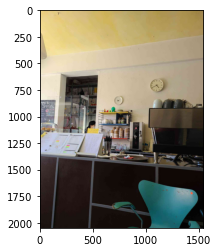

가장 가까운 이미지
0, ['초콜릿' '민트' '특이' '맛있' '당' '카페' '예쁘'], distance : 0.0


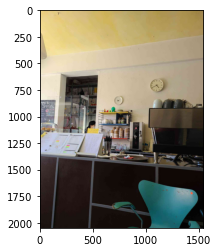

1, ['체인' '많' '보통' '흑설탕' '밀크' '누' '크래커' '독특' '아이스크림' '추천' '이날' '목' '음료'
 '아이스크림' '주문' '조금' '달기' '곳' '아이스크림' '메뉴' '강추' '에어컨' '매장' '안' '고장' '덥' '짜증'
 '찰나' '사장님' '죄송' '마음' '러' '친절' '더위' '기분' '좋' '기억'], distance : 2.1457672119140625e-06


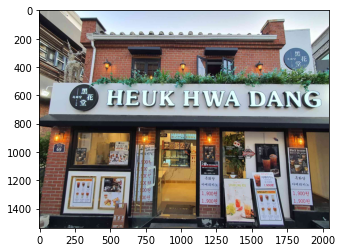

2, ['레몬' '이드' '인테리어' '예쁘' '조용' '맛있'], distance : 1.0784715414047241e-05


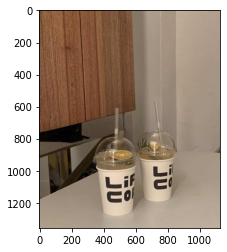

3, ['가게' '내부' '크' '널찍' '전반적' '조용' '깔끔' '분위기' '좋' '이렇' '커피' '카페' '플랫' '화이트'
 '원두' '산미' '없' '고소' '우유' '촉촉' '부드럽' '느낌' '커피' '커피' '가격' '착하' '주차' '가능'], distance : 2.5723129510879517e-05


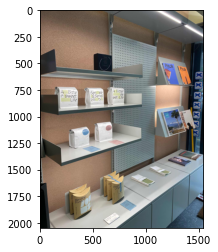

4, ['체인점' '가게' '장점' '진하' '연하' '선택' '가능' '가게' '작지' '정리' '깔끔' '커피' '바디' '감'
 '아쉽' '성비' '좋'], distance : 3.135576844215393e-05


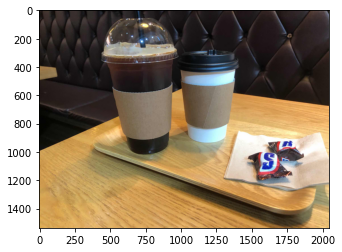

5, ['동네' '작' '카페' '방면' '괜찮' '카페' '슈페너' '인기' '메뉴' '같' '날' '따뜻' '커피' '푸하' '노'
 '주문' '메뉴' '커피' '산미' '탄' '맛' '고소' '깔끔' '제주말' '차' '쿠키' '화이트' '초콜릿' '미아'
 '말차' '씁쓸' '취향' '쿠키' '도전' '인테리어' '층' '고가' '높' '크' '공간' '불구' '느낌' '크' '초록빛'
 '화분' '따뜻' '분위기' '동네' '장' '사여' '그렇' '사장님' '친절' '좋' '여러모' '동네' '괜찮' '카페'
 '발견' '신나' '방문' '확률' '퍼센트'], distance : 3.59266996383667e-05


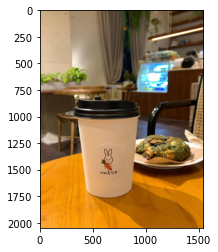

6, ['디저트' '대체' '부자연' '스럽' '같' '요즘' '비' '맛있' '집' '아쉽'], distance : 4.089623689651489e-05


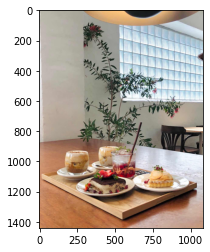

7, ['디저트' '대체' '부자연' '스럽' '같' '요즘' '비' '맛있' '집' '아쉽'], distance : 4.089623689651489e-05


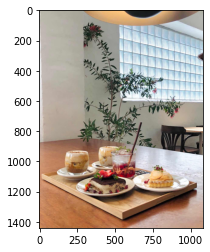

8, [], distance : 6.256625056266785e-05


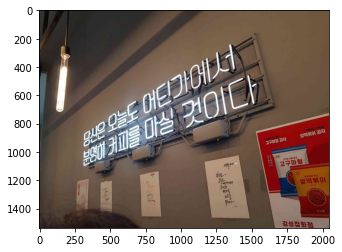

9, ['커피' '맛있' '양도' '자' '임' '좌석' '편안' '테이블' '간격' '괜찮' '분위기' '요즘' '같' '인' '스타'
 '감성' '스터디' '카페' '느낌' '좋' '흡연' '구역' '카페' '옆' '차고' '지에' '마련' '흡연자' '메리트'
 '있음' '역' '정도' '거리' '동네' '카페' '임' '역' '가깝' '편'], distance : 6.774440407752991e-05


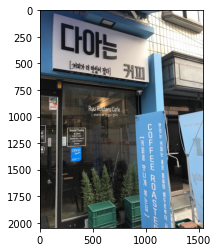

가장 먼 이미지
0, ['동네' '숨' '카페' '예' '가정집' '같' '예쁘' '인테리어' '카페' '카페인' '안되' '사람' '모든' '커피'
 '디' '카페인' '전환' '좋' '커피숍'], distance : 0.14606468379497528


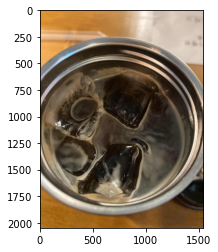

1, ['동네' '주민' '같' '한적' '카페' '카페' '좌석' '문' '배치' '좋' '카페' '좋'], distance : 0.14781835675239563


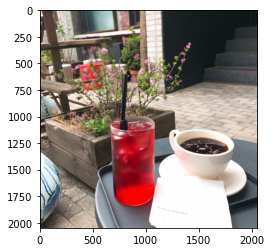

2, ['카페' '예쁘' '양과자' '맛있' '주인' '분' '친절' '주차' '가능' '좋'], distance : 0.148999884724617


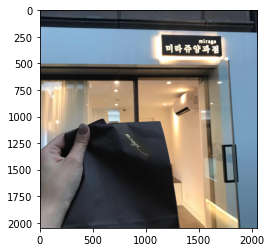

3, ['예쁘' '향기' '카페' '주인' '언니' '친절' '카페' '메뉴' '이쁘' '맛' '좋' '사진' '예쁘' '스피커' '음향'
 '좋' '그릇' '예쁘' '좋'], distance : 0.15089799463748932


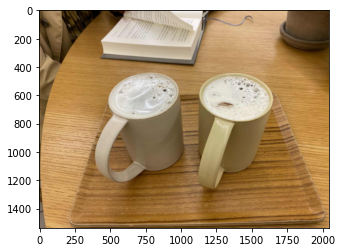

4, ['암' '위치' '인' '스타' '유명' '케이크' '가게' '한성' '대' '입구' '기념일' '프로젝트' '운영' '때'
 '방문' '고려대' '오픈' '마이' '버터' '드림' '내가' '방문' '때' '웨이팅' '맛' '웨이팅' '각오' '정도'
 '맛'], distance : 0.15280458331108093


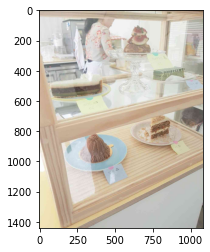

5, ['가격' '보고' '수긍' '곳' '맛있' '구슬' '맛있' '슈크림' '레' '알'], distance : 0.15577828884124756


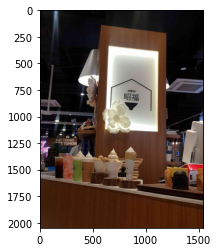

6, ['이' '커피' '맛' '커피' '맛있' '카페' '무엇' '테이블' '책' '은은' '조명' '아늑' '인테리어' '좋'], distance : 0.16719970107078552


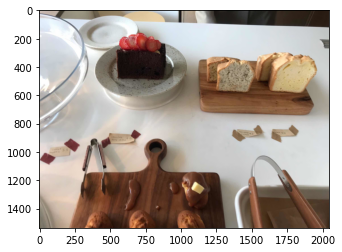

7, ['사진' '좋' '수' '길' '프로젝트' '서울' '곳곳' '포토' '존' '업' '로드' '사진' '좋' '곳' '사람' '없'
 '한적' '밀크' '당근' '케이크' '맛있' '화려' '예쁘' '편하' '느낌'], distance : 0.16770590841770172


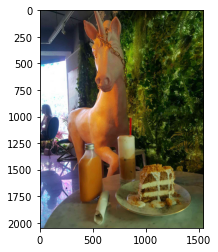

8, ['인' '스타' '만큼' '맛있' '재' '방문' '의사' '없'], distance : 0.170312762260437


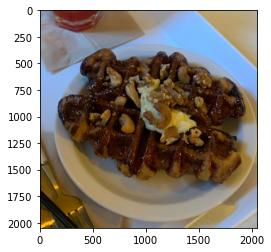

9, ['레드' '벨벳' '짱' '같' '맛있' '전체적' '마카롱' '사랑'], distance : 0.17193135619163513


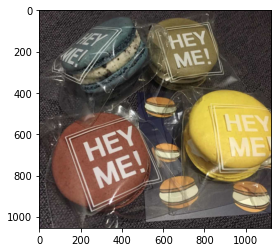

In [108]:

# text embedding 을 한 것을 통해 target image와 가장 가까운 10개, 가장 먼 10개 보여주기
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import matplotlib.pyplot as plt

tmp = np.array(embed_list).reshape(-1,1)
dist_mtx = euclidean_distances(tmp,tmp)

target_idx = 290

# 가장 가까운 것의 인덱스를 제공해준다
# ex target_idx가 200이라면, 첫 인덱스는 200
close_list = dist_mtx[target_idx].argsort()[0:10]
far_list = dist_mtx[target_idx].argsort()[-11:-1]

print(f"target img : {target_idx}")
img, rev = img_data[target_idx]
print(f"{i}, {rev}")
plt.imshow(img)
plt.show()


print("가장 가까운 이미지")
print("======================")
# target을 포함해 target과 가장 가까운 것 10개
for i, idx in enumerate(close_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()

print("가장 먼 이미지")
print("======================")
# target과 가장 먼것 10개
for i, idx in enumerate(far_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()



target img : 2600
9, ['매장' '작' '주말' '포기' '정도' '크기' '쿠키' '포장' '맛있' '쿠키' '테이크' '아웃' '가치' '곳' '같'
 '역' '멀' '긴하' '밥' '소화' '좋' '거리' '때' '큰일' '남']


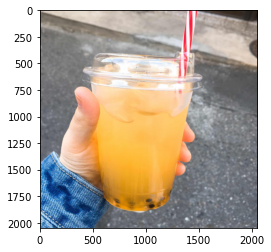

가장 가까운 이미지
0, ['매장' '작' '주말' '포기' '정도' '크기' '쿠키' '포장' '맛있' '쿠키' '테이크' '아웃' '가치' '곳' '같'
 '역' '멀' '긴하' '밥' '소화' '좋' '거리' '때' '큰일' '남'], distance : 0.0


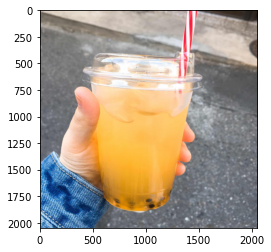

1, ['작' '공간' '깔끔' '커피' '디저트' '곳' '로' '데이' '세트' '합리적' '가격' '귀엽'], distance : 0.00017255544662475586


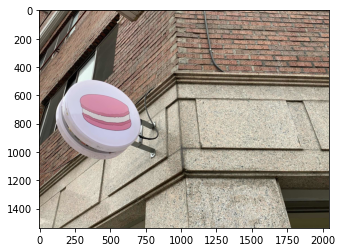

2, ['시원' '음료' '레' '시간' '시간' '정도' '배고프' '브레드' '좋'], distance : 0.00017951428890228271


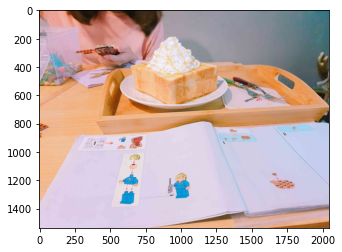

3, ['카페' '사장님' '친절' '하심' '테이블' '없' '외부' '음식물' '반입' '환영' '중간' '중간' '컵' '물'
 '주신' '커피맛' '좋'], distance : 0.00020267069339752197


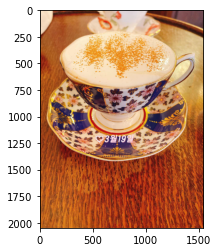

4, ['분위기' '독특' '스케이트' '보드' '신기' '빵' '맛있' '한데' '가격' '비싸' '느낌' '당' '근' '모양' '빵'
 '이랑' '이슈' '맛있'], distance : 0.00022241473197937012


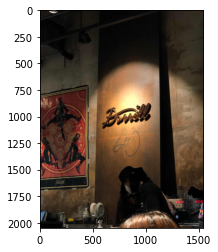

5, ['코' '비엔나' '커피' '맛있' '오리지널' '비엔나' '커피' '맛있' '사장님' '친절' '하심' '짱'], distance : 0.0002744942903518677


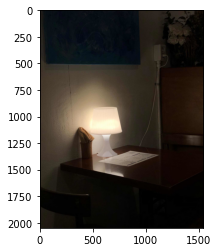

6, ['메인' '롤' '케익' '특징' '그렇' '히' '커피' '맛있' '서비스' '특별' '자리' '불편' '위치' '특색' '이유'
 '없' '인쇄소'], distance : 0.000367775559425354


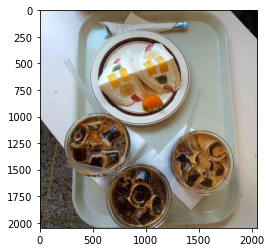

7, ['음료' '가격' '착하' '개성' '좋' '부담' '디저트'], distance : 0.0005149096250534058


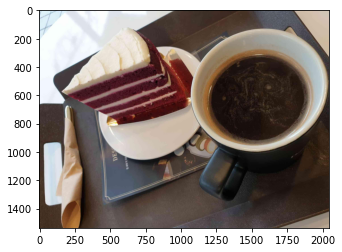

8, ['좁' '테이크' '아웃' '커피' '길' '함' '커피' '평가' '우위' '레벨' '급'], distance : 0.0005521178245544434


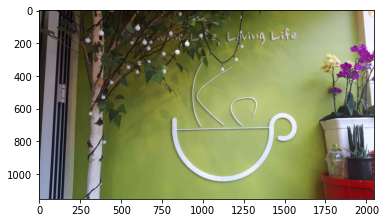

9, ['공' '파크' '식물' '많' '예쁘' '안' '예쁘' '카운터' '뒤쪽' '자리' '커피' '맛있' '만족'], distance : 0.0005868524312973022


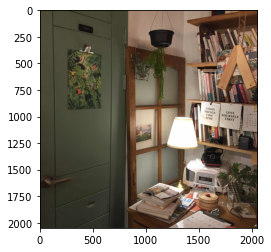

가장 먼 이미지
0, ['가격' '나쁘' '스타' '느낌' '공부' '좋' '커피' '맛' '읎' '디저트' '임' '공간' '곳' '동네' '모든'
 '카페' '사장님'], distance : 0.18978407979011536


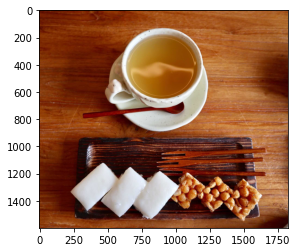

1, ['가격' '나쁘' '스타' '느낌' '공부' '좋' '커피' '맛' '읎' '디저트' '임' '공간' '곳' '동네' '모든'
 '카페' '사장님'], distance : 0.18978407979011536


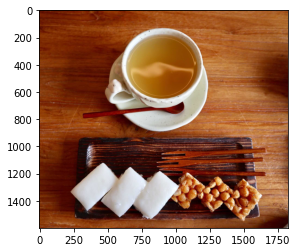

2, ['아이스크림' '와플' '처음' '아이스크림' '맛과' '와플' '맛' '코' '맛' '맛있'], distance : 0.19002610445022583


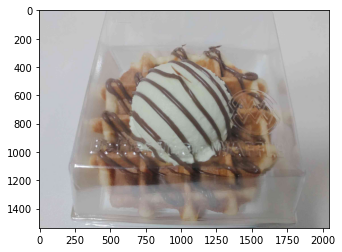

3, ['외관' '예쁘' '음료' '디저트' '질' '좋' '빙수' '맛있'], distance : 0.19066888093948364


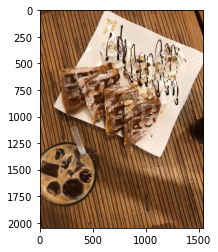

4, ['아늑' '곳'], distance : 0.19131425023078918


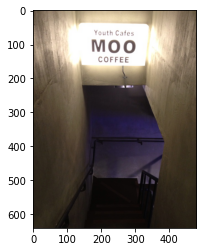

5, ['외관' '깔끔' '인테리어' '훌륭' '커피' '맛' '좋' '수제' '디저트' '맛있'], distance : 0.19235387444496155


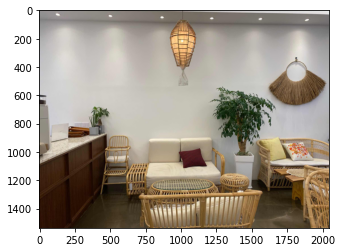

6, ['이' '가격' '커피세트' '맛있' '풍성' '오늘' '파스타' '수준급' '식전' '빵' '예술' '불고기' '단' '집'
 '밥' '샌드위치' '명물'], distance : 0.1934647560119629


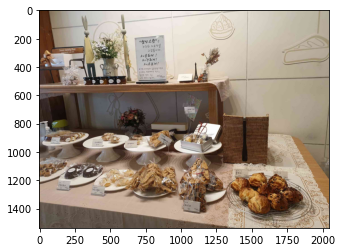

7, ['단편' '영화관' '예쁘' '카페' '간식' '비' '건' '메뉴' '분위기' '좋'], distance : 0.19787824153900146


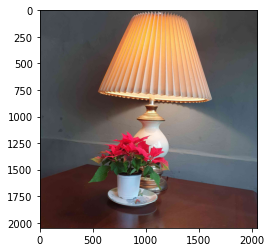

8, ['매장' '깔끔' '오픈' '형' '주방' '좋' '가격' '적당' '맛있'], distance : 0.2004685252904892


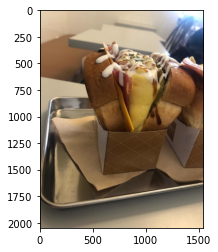

9, ['용' '열정' '골목' '위치' '분위기' '카페' '용' '열정' '골목' '과거' '인쇄소' '곳' '산업' '발달'
 '인쇄물' '디지털화' '인쇄소' '시작' '가게' '로' '삭막' '골목길' '열정' '청년' '감각적' '느낌' '창업'
 '열정' '골목' '탄생' '로지' '커피' '그중' '하나' '젊' '운영' '인테리어' '소품' '조명' '음악' '하나하나'
 '신경' '안' '부분' '없' '오렌지' '라' '떼' '추천' '메뉴' '상큼' '커피' '맛' '취향'], distance : 0.20680876076221466


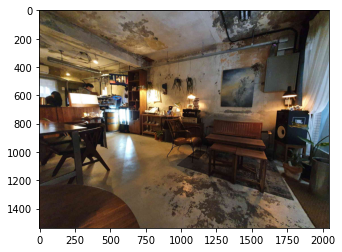

In [109]:

# text embedding 을 한 것을 통해 target image와 가장 가까운 10개, 가장 먼 10개 보여주기
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import matplotlib.pyplot as plt

tmp = np.array(embed_list).reshape(-1,1)
dist_mtx = euclidean_distances(tmp,tmp)

target_idx = 2600

# 가장 가까운 것의 인덱스를 제공해준다
# ex target_idx가 200이라면, 첫 인덱스는 200
close_list = dist_mtx[target_idx].argsort()[0:10]
far_list = dist_mtx[target_idx].argsort()[-11:-1]

print(f"target img : {target_idx}")
img, rev = img_data[target_idx]
print(f"{i}, {rev}")
plt.imshow(img)
plt.show()


print("가장 가까운 이미지")
print("======================")
# target을 포함해 target과 가장 가까운 것 10개
for i, idx in enumerate(close_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()

print("가장 먼 이미지")
print("======================")
# target과 가장 먼것 10개
for i, idx in enumerate(far_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()



target img : 1200
9, ['야' '끼' '샌드위치' '맛있' '음료' '맛' '샌드위치' '직접' '제조' '맛' '좋']


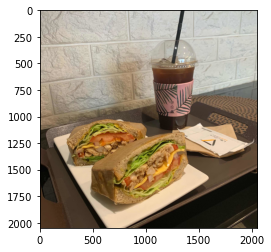

가장 가까운 이미지
0, ['야' '끼' '샌드위치' '맛있' '음료' '맛' '샌드위치' '직접' '제조' '맛' '좋'], distance : 0.0


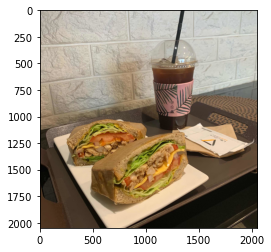

1, ['야' '끼' '샌드위치' '맛있' '음료' '맛' '샌드위치' '직접' '제조' '맛' '좋'], distance : 0.0


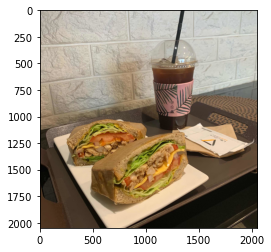

2, ['맛있' '청포도' '쥬스' '강추' '흑임자' '빙수' '맛있' '크레이프' '수플레' '맛있'], distance : 7.918477058410645e-05


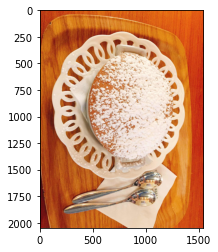

3, ['맛있' '청포도' '쥬스' '강추' '흑임자' '빙수' '맛있' '크레이프' '수플레' '맛있'], distance : 7.918477058410645e-05


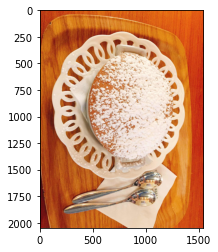

4, ['시간' '카페' '직원' '친절' '자리' '편하' '좋'], distance : 7.918477058410645e-05


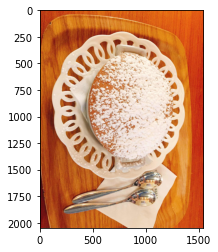

5, ['시간' '카페' '직원' '친절' '자리' '편하' '좋'], distance : 7.918477058410645e-05


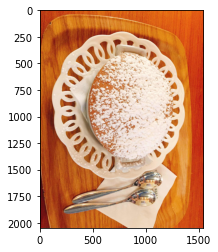

6, ['다음' '아상' '사람' '많' '조용' '넓' '빵' '종류' '많' '좋'], distance : 9.560585021972656e-05


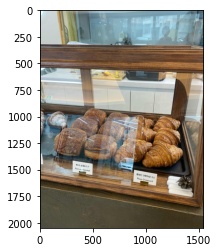

7, ['코' '엑스' '스타' '필드' '층' '라미' '맛있' '추가' '말차' '종류' '유명' '같' '공간' '넓' '좋'], distance : 0.0001017153263092041


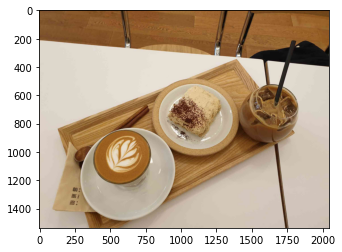

8, ['사람' '많' '용' '도넛' '맛있' '유'], distance : 0.00014340877532958984


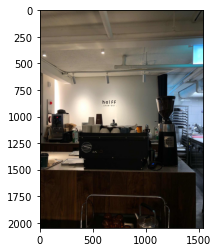

9, ['사람' '많' '용' '도넛' '맛있' '유'], distance : 0.00014340877532958984


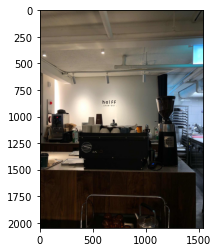

가장 먼 이미지
0, ['밀크' '전문점' '밀크' '종류' '다양' '솔트' '고' '단' '조화' '좋'], distance : 0.546018123626709


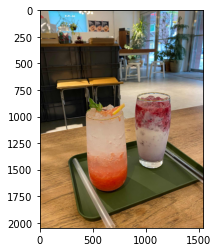

1, ['조용' '곳' '위치' '평일' '낮' '그렇' '사람' '조용' '좋' '깔끔' '찰떡' '와플' '빵' '떡' '와플'
 '모양' '위' '아이스크림' '견과' '꿀' '달콤' '맛있' '운영' '시간' '오전' '저녁' '일요일' '날' '카페'
 '문' '아쉽' '시간' '내서' '오기' '좋' '카페'], distance : 0.5523463487625122


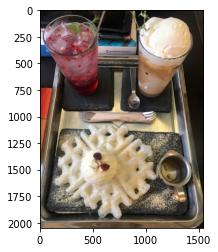

2, ['핑크' '화이트' '톤' '이쁘' '카페' '가방' '여분' '의자' '사장님' '센스' '커피' '디저트' '모두' '맛'
 '좋'], distance : 0.5539442896842957


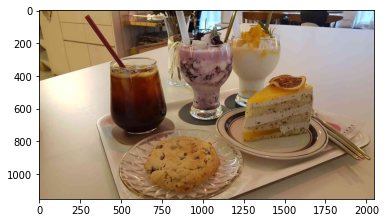

3, ['상도' '역' '근처' '디저트' '카페' '상도' '동' '디저트' '전문' '곳' '많' '사람' '디저트' '종류' '많'
 '맛' '준수'], distance : 0.5573124289512634


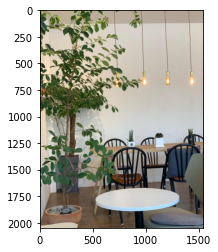

4, ['마카롱' '맛' '집' '생각' '난해' '앤' '인테리어' '안쪽' '넓' '자리' '담소' '나누기' '좋'], distance : 0.5618850588798523


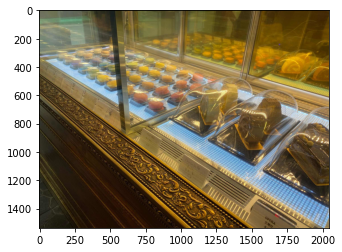

5, ['동네' '홀' '높' '빌딩' '꼭대기' '뷰' '좋' '아메리카' '노' '맛있' '서남권' '제일' '전망' '좋' '카페'
 '단골' '이용'], distance : 0.5649363994598389


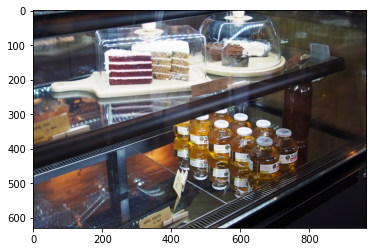

6, ['카페' '다' '이닝' '코드' '근처' '카페' '검색' '곳' '대학가' '근처' '적당' '가격' '슈페너' '종류' '논'
 '카페인' '음료' '라인업' '다양' '소품' '분위기' '좋' '직원' '분' '친절' '에이드' '패션' '후' '르' '맛'
 '기대' '단맛' '아쉽' '급하' '검색' '만족' '다' '이닝' '코드' '순기능'], distance : 0.6190146207809448


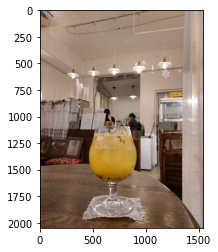

7, ['영등포' '자리' '없' '방문' '곳' '예전' '화이트' '곳' '이름' '같' '타임머신' '타고' '시간' '여행'
 '느낌' '요즘' '웬만' '카페' '커피' '맛있' '커피' '밍밍' '장소' '값'], distance : 0.6311191320419312


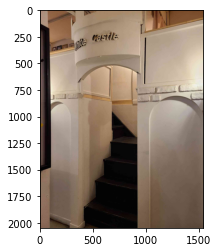

8, ['크' '처음' '저렴' '가격' '애' '거대' '양' '만족'], distance : 0.6380271315574646


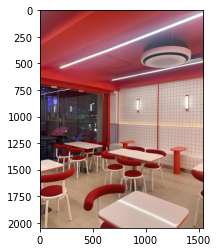

9, ['와인' '커피' '작' '식당' '크기' '작' '단체' '소파' '석도' '바' '도' '일반' '테이블' '다채' '같'
 '커피' '흔하' '특색' '그렇' '맛' '같' '절' '좋' '사람' '많' '분' '양해' '자리' '감사' '다음' '와인'], distance : 0.7260331511497498


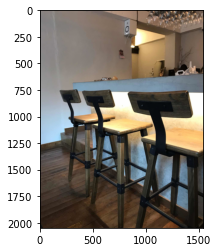

In [110]:
# resnet embedding 만을 썼을때 target image와 가장 가까운 10개, 가장 먼 10개 보여주기
#
tmp = np.array(resnet_embed_list).reshape(-1,1)
dist_mtx = euclidean_distances(tmp,tmp)

target_idx = 1200

# 가장 가까운 것의 인덱스를 제공해준다
# ex target_idx가 200이라면, 첫 인덱스는 200
close_list = dist_mtx[target_idx].argsort()[0:10]
far_list = dist_mtx[target_idx].argsort()[8226:8236]

print(f"target img : {target_idx}")
img, rev = img_data[target_idx]
print(f"{i}, {rev}")
plt.imshow(img)
plt.show()
print("======================")

print("가장 가까운 이미지")
print("======================")
# target을 포함해 target과 가장 가까운 것 10개
for i, idx in enumerate(close_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()

print("가장 먼 이미지")
print("======================")
# target과 가장 먼것 10개
for i, idx in enumerate(far_list):
    img, rev = img_data[idx]
    print(f"{i}, {rev}, distance : {dist_mtx[target_idx][idx]}")
    plt.imshow(img)
    plt.show()



In [ ]:
close_list

array([ 200, 5867, 3828, 6924,  287, 7804, 5155, 5607, 3577, 4021])

1.7523766e-05